In [31]:
!nvidia-smi

Fri Aug 28 02:02:48 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   49C    P8             14W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [32]:
!git clone https://github.com/WongKinYiu/yolov9.git
%cd yolov9

!pip install -q -r requirements.txt

Cloning into 'yolov9'...
remote: Enumerating objects: 781, done.
remote: Total 781 (delta 0), reused 0 (delta 0), pack-reused 781 (from 1)
Receiving objects: 100% (781/781), 3.27 MiB | 30.44 MiB/s, done.
Resolving deltas: 100% (330/330), done.
/content/yolov9
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 221.9/221.9 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 124.3 MB/s eta 0:00:00


In [33]:
!git clone https://github.com/WongKinYiu/yolov9.git
%cd yolov9

!pip install -q -r requirements.txt

Cloning into 'yolov9'...
remote: Enumerating objects: 781, done.
remote: Total 781 (delta 0), reused 0 (delta 0), pack-reused 781 (from 1)
Receiving objects: 100% (781/781), 3.27 MiB | 29.90 MiB/s, done.
Resolving deltas: 100% (330/330), done.
/content/yolov9/yolov9


In [34]:
import torch

print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

PyTorch: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


In [36]:
DATASET_1 = original_zip_dirs[0]
DATASET_2 = original_zip_dirs[1]

In [39]:
import os
from pathlib import Path # Import Path for base_dataset_path

def show_structure(path):
    print(f"\nDataset: {path}")

    # Ensure path is a Path object for replace(str(path)) to work correctly
    path = Path(path)

    for root, dirs, files in os.walk(path):
        level = root.replace(str(path), "").count(os.sep)
        indent = "  " * level
        print(f"{indent}{os.path.basename(root)}/")

        for f in files[:10]: # Limit to 10 files per directory for brevity
            print(f"{indent}  {f}")

        # Removed the line that limited directory depth

base_dataset_path = Path('/content/hazard_dataset') # Define base_dataset_path here
show_structure(base_dataset_path)


Dataset: /content/hazard_dataset
hazard_dataset/
  images/
    test/
    train/
    val/
  labels/
    test/
    train/
    val/


In [42]:
import zipfile
import shutil
import os
from pathlib import Path
from sklearn.model_selection import train_test_split

# Define the base directory for the organized dataset
base_dataset_path = Path('/content/hazard_dataset')
initial_pool_images_dir = base_dataset_path / 'initial_pool' / 'images'
initial_pool_labels_dir = base_dataset_path / 'initial_pool' / 'labels'

# --- Step 1: Re-extract the zip files to temporary locations ---
# We need to re-extract because temporary directories might have been cleaned up.
print('Re-extracting zip files to temporary locations...')
original_zip_dirs = [] # Reinitialize to capture new temporary paths
# The 'uploaded' variable is expected to be in the global scope from a previous files.upload() call
for file_name, file_content in uploaded.items():
    if file_name.endswith(".zip"):
        # Create a unique temporary directory name for extraction
        extract_dir = Path("/content/temp_extracted_" + file_name.replace(".zip", "").replace(" ", "_").replace("(", "").replace(")", ""))
        original_zip_dirs.append(extract_dir)
        os.makedirs(extract_dir, exist_ok=True)

        # Write the bytes content to a temporary zip file
        temp_zip_path = Path(f"/content/{file_name}")
        with open(temp_zip_path, 'wb') as f:
            f.write(file_content)

        # Extract the contents
        with zipfile.ZipFile(temp_zip_path, 'r') as zip_ref:
            zip_ref.extractall(extract_dir)
        print(f"  Re-extracted: {extract_dir}")
        os.remove(temp_zip_path) # Clean up temp zip file
print('Re-extraction complete.')

# --- Step 2: Clear existing hazard_dataset directories and re-create them, including initial_pool ---
print('\nClearing and re-creating hazard_dataset structure...')
for split_dir in ['train', 'val', 'test']:
    img_dir = base_dataset_path / 'images' / split_dir
    lbl_dir = base_dataset_path / 'labels' / split_dir
    if img_dir.exists():
        shutil.rmtree(img_dir)
    if lbl_dir.exists():
        shutil.rmtree(lbl_dir)
    os.makedirs(img_dir, exist_ok=True)
    os.makedirs(lbl_dir, exist_ok=True)

# Clear and create initial_pool directories
if initial_pool_images_dir.parent.exists(): # Check parent ('initial_pool') to remove all at once
    shutil.rmtree(initial_pool_images_dir.parent)
os.makedirs(initial_pool_images_dir, exist_ok=True)
os.makedirs(initial_pool_labels_dir, exist_ok=True)

print('Hazard_dataset structure re-initialized.')


# --- Step 3: Consolidate all 'train' images and labels from re-extracted data into initial_pool ---
print('\nConsolidating all images and labels into initial_pool_images_dir...')

for original_dir in original_zip_dirs:
    source_train_images = original_dir / 'train' / 'images'
    source_train_labels = original_dir / 'train' / 'labels'

    if source_train_images.exists():
        for img_file in source_train_images.glob('*'):
            shutil.copy(img_file, initial_pool_images_dir) # Use copy to preserve original if needed
    if source_train_labels.exists():
        for label_file in source_train_labels.glob('*.txt'):
            shutil.copy(label_file, initial_pool_labels_dir)

print('Consolidation into initial_pool complete.')
print(f"Total images in initial_pool_images_dir: {len(list(initial_pool_images_dir.glob('*')))}")
print(f"Total labels in initial_pool_labels_dir: {len(list(initial_pool_labels_dir.glob('*.txt')))}")

# --- Step 4: Perform Train-Validation-Test Split ---
print('\nStarting train-validation-test split (70/20/10)...')

# Get all image paths from the initial_pool directory
all_image_paths = list(initial_pool_images_dir.glob('*'))

if not all_image_paths:
    print("Error: No images found in the initial pool directory. Cannot perform split.")
else:
    # Define split ratios
    train_ratio = 0.7
    val_ratio = 0.2
    test_ratio = 0.1

    # First split: Separate out test set
    train_val_images, test_images = train_test_split(all_image_paths, test_size=test_ratio, random_state=42)

    # Second split: Separate out validation set from the remaining train_val set
    val_test_size_relative = val_ratio / (train_ratio + val_ratio)
    train_images, val_images = train_test_split(train_val_images, test_size=val_test_size_relative, random_state=42)

    print(f"Total images: {len(all_image_paths)}")
    print(f"New Train images: {len(train_images)}")
    print(f"New Val images: {len(val_images)}")
    print(f"New Test images: {len(test_images)}")

    # Function to move image and its corresponding label
    def move_files(file_list, target_image_dir, target_label_dir):
        os.makedirs(target_image_dir, exist_ok=True)
        os.makedirs(target_label_dir, exist_ok=True)
        for img_path in file_list:
            # Construct the source label path from the *initial pool labels directory*
            label_path_source = initial_pool_labels_dir / (img_path.stem + '.txt')

            # Move the image
            shutil.move(str(img_path), target_image_dir)
            # Move the label if it exists
            if label_path_source.exists():
                shutil.move(str(label_path_source), target_label_dir)
            else:
                print(f"Warning: Label file not found for {img_path.name} at {label_path_source}")

    print("\nMoving files from initial_pool to their respective new split directories...")
    # Move files to their final destinations
    move_files(train_images, base_dataset_path / 'images' / 'train', base_dataset_path / 'labels' / 'train')
    move_files(val_images, base_dataset_path / 'images' / 'val', base_dataset_path / 'labels' / 'val')
    move_files(test_images, base_dataset_path / 'images' / 'test', base_dataset_path / 'labels' / 'test')
    print("File splitting and movement complete.")

    # Final verification after split and move
    print('\n--- Verifying Hazard Dataset Content After Split ---')
    for split_name in ['train', 'val', 'test']:
        images_path = base_dataset_path / 'images' / split_name
        labels_path = base_dataset_path / 'labels' / split_name

        image_count = len(list(images_path.glob('*')))
        label_count = len(list(labels_path.glob('*.txt')))

        print(f"Hazard Dataset - {split_name.capitalize()} Images: {image_count}")
        print(f"Hazard Dataset - {split_name.capitalize()} Labels: {label_count}")

    print('\nDataset split and organization confirmed.')

# --- Step 5: Clean up temporary extracted directories ---
print('\nCleaning up temporary extracted and initial_pool directories...')
for original_dir in original_zip_dirs:
    if original_dir.exists():
        shutil.rmtree(original_dir)
if initial_pool_images_dir.parent.exists():
    shutil.rmtree(initial_pool_images_dir.parent) # Cleans up 'initial_pool' directory
print('Temporary directories cleaned up.')

Re-extracting zip files to temporary locations...
  Re-extracted: /content/temp_extracted_Shock_Absorber.v1-v1.yolov9
  Re-extracted: /content/temp_extracted_scrap_hazdetection.v1-v1.yolov9_1
Re-extraction complete.

Clearing and re-creating hazard_dataset structure...
Hazard_dataset structure re-initialized.

Consolidating all images and labels into initial_pool_images_dir...
Consolidation into initial_pool complete.
Total images in initial_pool_images_dir: 512
Total labels in initial_pool_labels_dir: 512

Starting train-validation-test split (70/20/10)...
Total images: 512
New Train images: 357
New Val images: 103
New Test images: 52

Moving files from initial_pool to their respective new split directories...
File splitting and movement complete.

--- Verifying Hazard Dataset Content After Split ---
Hazard Dataset - Train Images: 357
Hazard Dataset - Train Labels: 357
Hazard Dataset - Val Images: 103
Hazard Dataset - Val Labels: 103
Hazard Dataset - Test Images: 52
Hazard Dataset - T

In [45]:
# --- Step 6: Create the combined data.yaml file ---
print('\nCreating combined data.yaml file...')

import yaml # Ensure yaml is imported
from pathlib import Path # Ensure Path is imported

def load_yaml(file_path):
    with open(file_path, 'r') as f:
        return yaml.safe_load(f)

def save_yaml(data, file_path):
    with open(file_path, 'w') as f:
        yaml.safe_dump(data, f, sort_keys=False)

# Load original data.yaml files from the persistent extracted directories to get class names
# These directories were created during the initial extraction and should still exist.
original_yaml_path_1 = Path('/content/Shock Absorber.v1-v1.yolov9') / 'data.yaml'
original_yaml_path_2 = Path('/content/scrap hazdetection.v1-v1.yolov9 (1)') / 'data.yaml'

data1 = load_yaml(original_yaml_path_1)
data2 = load_yaml(original_yaml_path_2)

# Combine class names, ensuring no duplicates and sorting for consistency
combined_names = sorted(list(set(data1['names'] + data2['names'])))

# Define the content for the new data.yaml
combined_data_yaml_content = {
    'path': str(base_dataset_path), # Base path to the dataset (defined in previous cell)
    'train': 'images/train',          # Path to training images relative to 'path'
    'val': 'images/val',              # Path to validation images relative to 'path'
    'test': 'images/test',            # Path to test images relative to 'path'
    'names': combined_names,
}

# Save the new data.yaml to the base_dataset_path
combined_data_yaml_path = base_dataset_path / 'data.yaml'
save_yaml(combined_data_yaml_content, combined_data_yaml_path)

print(f"Combined data.yaml created at: {combined_data_yaml_path}")

# Display the content of the created data.yaml for verification
print('\nContent of data.yaml:')
with open(combined_data_yaml_path, 'r') as f:
    print(f.read())


Creating combined data.yaml file...
Combined data.yaml created at: /content/hazard_dataset/data.yaml

Content of data.yaml:
path: /content/hazard_dataset
train: images/train
val: images/val
test: images/test
names:
- Cylinder
- Shock-Absorber
- shock absorber



In [46]:
from pathlib import Path
from collections import Counter

def count_classes(label_dir):
    counts = Counter()

    for file in Path(label_dir).glob("*.txt"):
        with open(file, "r") as f:
            for line in f:
                parts = line.strip().split()

                if len(parts) == 0:
                    continue

                class_id = int(parts[0])
                counts[class_id] += 1

    return counts

In [47]:
counts = count_classes("/path/to/labels")

print("Class counts:")
print("Cylinder:", counts[0])
print("Shock Absorber:", counts[1])

Class counts:
Cylinder: 0
Shock Absorber: 0


In [48]:
total = sum(counts.values())

for class_id, count in counts.items():
    percentage = count / total * 100
    print(class_id, count, f"{percentage:.2f}%")

In [49]:
cylinder = counts[0]
shock_absorber = counts[1]

ratio = max(cylinder, shock_absorber) / min(cylinder, shock_absorber)

print("Class imbalance ratio:", ratio)

ZeroDivisionError: division by zero

In [50]:
from pathlib import Path
import shutil

def merge_dataset(src_images, src_labels, destination, prefix):

    src_images = Path(src_images)
    src_labels = Path(src_labels)

    destination = Path(destination)

    dst_images = destination / "images"
    dst_labels = destination / "labels"

    dst_images.mkdir(parents=True, exist_ok=True)
    dst_labels.mkdir(parents=True, exist_ok=True)

    image_extensions = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

    copied = 0

    for image in src_images.iterdir():

        if image.suffix.lower() not in image_extensions:
            continue

        label = src_labels / f"{image.stem}.txt"

        if not label.exists():
            print("WARNING: missing label:", image.name)
            continue

        new_name = f"{prefix}_{image.name}"
        new_label = f"{prefix}_{image.stem}.txt"

        shutil.copy2(image, dst_images / new_name)
        shutil.copy2(label, dst_labels / new_label)

        copied += 1

    print(f"{prefix}: copied {copied} images")

In [51]:
!pip install -q imagehash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 14.9 MB/s eta 0:00:00


In [52]:
from PIL import Image
import imagehash
from pathlib import Path

image_hashes = {}

image_dir = Path("/content/combined_dataset/images")

for image_path in image_dir.iterdir():

    try:
        img = Image.open(image_path)
        h = str(imagehash.phash(img))

        if h in image_hashes:
            print(
                "Possible duplicate:",
                image_path.name,
                "<->",
                image_hashes[h]
            )
        else:
            image_hashes[h] = image_path.name

    except Exception as e:
        print("Error:", image_path, e)

FileNotFoundError: [Errno 2] No such file or directory: '/content/combined_dataset/images'

In [53]:
from pathlib import Path

dataset_root = Path("/content/hazardous_waste_yolov9")

for split in ["train", "val", "test"]:

    images = list((dataset_root / "images" / split).glob("*"))
    labels = list((dataset_root / "labels" / split).glob("*.txt"))

    image_stems = {x.stem for x in images}
    label_stems = {x.stem for x in labels}

    print("\n", split)
    print("Images:", len(image_stems))
    print("Labels:", len(label_stems))

    print("Images without labels:",
          len(image_stems - label_stems))

    print("Labels without images:",
          len(label_stems - image_stems))


 train
Images: 0
Labels: 0
Images without labels: 0
Labels without images: 0

 val
Images: 0
Labels: 0
Images without labels: 0
Labels without images: 0

 test
Images: 0
Labels: 0
Images without labels: 0
Labels without images: 0


In [54]:
def validate_polygon_labels(label_dir, num_classes=2):

    label_dir = Path(label_dir)

    errors = []

    for file in label_dir.glob("*.txt"):

        with open(file) as f:

            for line_number, line in enumerate(f, 1):

                values = line.strip().split()

                if not values:
                    continue

                try:
                    class_id = int(values[0])
                except:
                    errors.append(
                        f"{file.name}:{line_number}: invalid class"
                    )
                    continue

                if class_id < 0 or class_id >= num_classes:
                    errors.append(
                        f"{file.name}:{line_number}: invalid class {class_id}"
                    )

                coords = list(map(float, values[1:]))

                if len(coords) < 6 or len(coords) % 2 != 0:
                    errors.append(
                        f"{file.name}:{line_number}: invalid polygon"
                    )
                    continue

                for c in coords:

                    if c < 0 or c > 1:
                        errors.append(
                            f"{file.name}:{line_number}: coordinate outside 0-1"
                        )

    return errors

In [55]:
errors = validate_polygon_labels(
    "/content/hazardous_waste_yolov9/labels/train"
)

print("Errors:", len(errors))

for error in errors[:20]:
    print(error)

Errors: 0


# Task
The user wants to prepare a dataset for YOLOv9 segmentation model training. The dataset consists of two zipped files containing images and labels, which need to be merged, split into train, validation, and test sets, and then verified for correctness and quality. This involves several steps: analyzing class distribution, verifying image-label correspondence, detecting duplicate images, validating polygon annotations, and visualizing annotations. The final output will be a prepared and validated dataset ready for YOLOv9 training.

## Analyze Class Distribution

### Subtask:
Accurately calculate and display the distribution of each class (Cylinder, Shock-Absorber, shock absorber) across the combined train, validation, and test datasets. This will involve iterating through the label files in the `/content/hazard_dataset/labels/train`, `/content/hazard_dataset/labels/val`, and `/content/hazard_dataset/labels/test` directories, tallying object instances for each class ID, and then mapping these IDs to their respective names from the `data.yaml` file. Finally, it will print the counts, percentages, and the overall class imbalance ratio.


**Reasoning**:
This step consolidates the class counting from all label directories, maps class IDs to names, calculates percentages, and computes the class imbalance ratio, addressing the previous errors.



In [56]:
from collections import Counter
import yaml
from pathlib import Path

# Define the base dataset path from previous steps
base_dataset_path = Path('/content/hazard_dataset')

# Load the combined data.yaml to get class names and count
# Ensure combined_data_yaml_path is defined if not already in global scope
combined_data_yaml_path = base_dataset_path / 'data.yaml'
with open(combined_data_yaml_path, 'r') as f:
    combined_data_yaml_content = yaml.safe_load(f)

class_names = combined_data_yaml_content['names']
num_classes = len(class_names)

def count_classes_in_directory(label_dir):
    counts = Counter()
    for file in Path(label_dir).glob("*.txt"):
        with open(file, "r") as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) > 0:
                    try:
                        class_id = int(parts[0])
                        # Ensure class_id is within the expected range
                        if 0 <= class_id < num_classes:
                            counts[class_id] += 1
                        else:
                            print(f"Warning: Class ID {class_id} out of range in {file.name}")
                    except ValueError:
                        print(f"Warning: Invalid class ID format in {file.name}: {line.strip()}")
    return counts

# Initialize a global counter for all classes across all splits
all_class_counts = Counter()

# Iterate through train, val, test label directories and aggregate counts
for split in ['train', 'val', 'test']:
    label_directory = base_dataset_path / 'labels' / split
    print(f"Counting classes in {label_directory}...")
    split_counts = count_classes_in_directory(label_directory)
    all_class_counts.update(split_counts)

print("\n--- Class Distribution ---")

total_instances = sum(all_class_counts.values())

if total_instances == 0:
    print("No object instances found in any label files.")
else:
    # Print counts and percentages for each class
    for class_id in range(num_classes):
        class_name = class_names[class_id]
        count = all_class_counts[class_id]
        percentage = (count / total_instances) * 100
        print(f"  {class_name} (ID: {class_id}): Count = {count}, Percentage = {percentage:.2f}%")

    # Calculate and print class imbalance ratio
    class_counts_values = [count for count in all_class_counts.values() if count > 0]
    if len(class_counts_values) > 1:
        max_count = max(class_counts_values)
        min_count = min(class_counts_values)
        if min_count > 0:
            imbalance_ratio = max_count / min_count
            print(f"\nClass Imbalance Ratio (Max/Min): {imbalance_ratio:.2f}")
        else:
            print("\nCannot calculate imbalance ratio: One or more classes have zero instances.")
    elif len(class_counts_values) == 1:
        print("\nOnly one class has instances, imbalance ratio is not applicable.")
    else:
        print("\nNo classes with instances to calculate imbalance ratio.")


Counting classes in /content/hazard_dataset/labels/train...
Counting classes in /content/hazard_dataset/labels/val...
Counting classes in /content/hazard_dataset/labels/test...

--- Class Distribution ---
  Cylinder (ID: 0): Count = 1577, Percentage = 55.43%
  Shock-Absorber (ID: 1): Count = 1268, Percentage = 44.57%
  shock absorber (ID: 2): Count = 0, Percentage = 0.00%

Class Imbalance Ratio (Max/Min): 1.24


## Verify Image-Label Correspondence

### Subtask:
Perform a comprehensive check to ensure that every image in the `/content/hazard_dataset/images/{train,val,test}` directories has a corresponding label file in `/content/hazard_dataset/labels/{train,val,test}`, and vice-versa. This step will use the correct dataset root (`/content/hazard_dataset`) to identify any discrepancies where an image might be missing its label, or a label file exists without an associated image.


**Reasoning**:
The current subtask is to verify image-label correspondence. I will implement the instructions to iterate through each dataset split, get the stems of image and label files, and then compare them to identify any discrepancies.



In [57]:
from pathlib import Path

# Define the base dataset path
base_dataset_path = Path('/content/hazard_dataset')

print("\n--- Verifying Image-Label Correspondence ---")

for split in ['train', 'val', 'test']:
    images_dir = base_dataset_path / 'images' / split
    labels_dir = base_dataset_path / 'labels' / split

    # Get all image stems (filenames without extension)
    image_stems = {img.stem for img in images_dir.glob('*') if img.is_file()}

    # Get all label stems (filenames without extension)
    label_stems = {lbl.stem for lbl in labels_dir.glob('*.txt') if lbl.is_file()}

    # Find images without corresponding label files
    images_without_labels = image_stems - label_stems

    # Find label files without corresponding image files
    labels_without_images = label_stems - image_stems

    print(f"\nSplit: {split.upper()}")
    print(f"  Total images: {len(image_stems)}")
    print(f"  Total labels: {len(label_stems)}")
    print(f"  Images without corresponding label files: {len(images_without_labels)}")
    if images_without_labels:
        print(f"    Examples: {list(images_without_labels)[:5]}") # Print up to 5 examples

    print(f"  Label files without corresponding image files: {len(labels_without_images)}")
    if labels_without_images:
        print(f"    Examples: {list(labels_without_images)[:5]}") # Print up to 5 examples

print("\nImage-Label Correspondence Check Complete.")


--- Verifying Image-Label Correspondence ---

Split: TRAIN
  Total images: 357
  Total labels: 357
  Images without corresponding label files: 0
  Label files without corresponding image files: 0

Split: VAL
  Total images: 103
  Total labels: 103
  Images without corresponding label files: 0
  Label files without corresponding image files: 0

Split: TEST
  Total images: 52
  Total labels: 52
  Images without corresponding label files: 0
  Label files without corresponding image files: 0

Image-Label Correspondence Check Complete.


## Detect Duplicate Images

### Subtask:
Identify potential duplicate images within the `/content/hazard_dataset/images` directory using perceptual hashing to prevent data leakage and ensure unbiased model evaluation. Any detected duplicates will be reported.


**Reasoning**:
The current subtask is to detect duplicate images. I will implement the instructions to iterate through all image files, calculate their perceptual hashes, and identify any duplicates.



In [60]:
from PIL import Image
import imagehash
from pathlib import Path

image_hashes = {}

# Define the base image directory to scan all subdirectories (train, val, test)
image_base_dir = Path("/content/hazard_dataset/images")

print(f"Scanning for duplicate images in: {image_base_dir}")

# Iterate through all image files in the base directory and its subdirectories
for image_path in image_base_dir.glob('**/*'):
    # Only process files, not directories, and check for common image extensions
    if image_path.is_file() and image_path.suffix.lower() in ['.jpg', '.jpeg', '.png', '.bmp', '.gif']:
        try:
            img = Image.open(image_path)
            # Use a slightly smaller hash size for faster comparison if needed, default is 8
            h = str(imagehash.phash(img))

            if h in image_hashes:
                print(
                    "Possible duplicate found:",
                    image_path.name, "<->", image_hashes[h],
                    f" (Path 1: {image_path}, Path 2: {image_hashes[h]})"
                )
            else:
                # Store the path of the first occurrence of this hash
                image_hashes[h] = str(image_path)

        except Exception as e:
            print(f"Error processing image {image_path}: {e}")

print("Duplicate image detection complete.")

Scanning for duplicate images in: /content/hazard_dataset/images
Possible duplicate found: Screenshot-2025-02-17-042608_png_png.rf.c8bbfbbcf16018a135482b541e512d0f.jpg <-> /content/hazard_dataset/images/test/Screenshot-2025-02-17-042608_png_png.rf.e8667d6477b73d3be322e51452fe81b9.jpg  (Path 1: /content/hazard_dataset/images/test/Screenshot-2025-02-17-042608_png_png.rf.c8bbfbbcf16018a135482b541e512d0f.jpg, Path 2: /content/hazard_dataset/images/test/Screenshot-2025-02-17-042608_png_png.rf.e8667d6477b73d3be322e51452fe81b9.jpg)
Possible duplicate found: Screenshot-2025-02-16-230628_png_png.rf.6de30e0bc5b0d9bf917da2ca63c01d55.jpg <-> /content/hazard_dataset/images/train/Screenshot-2025-02-16-230628_png_png.rf.875b1d83fbf24139327cd05e8e152f44.jpg  (Path 1: /content/hazard_dataset/images/train/Screenshot-2025-02-16-230628_png_png.rf.6de30e0bc5b0d9bf917da2ca63c01d55.jpg, Path 2: /content/hazard_dataset/images/train/Screenshot-2025-02-16-230628_png_png.rf.875b1d83fbf24139327cd05e8e152f44.jpg)


## Handle Duplicate Images

### Subtask:
Identify and remove duplicate images from the dataset based on perceptual hashes to prevent data leakage and ensure unbiased model evaluation. Keep only one instance of each unique image.


**Reasoning**:
The current subtask is to handle duplicate images. I will implement the instructions to initialize data structures, iterate through images, calculate perceptual hashes, identify duplicates, and then remove both the duplicate images and their corresponding label files. I will ensure the code handles image loading errors gracefully and provides a summary of the removals.



In [61]:
from PIL import Image
import imagehash
from pathlib import Path
import os

# Initialize data structures
unique_image_hashes = {}
duplicate_files_to_remove = []

# Define the base dataset path
base_dataset_path = Path('/content/hazard_dataset')
image_base_dir = base_dataset_path / 'images'
labels_base_dir = base_dataset_path / 'labels'

print(f"Scanning for duplicate images in: {image_base_dir}")

# Iterate through all image files in the base directory and its subdirectories
for image_path in image_base_dir.glob('**/*'):
    # Only process files, not directories, and check for common image extensions
    if image_path.is_file() and image_path.suffix.lower() in ['.jpg', '.jpeg', '.png', '.bmp', '.gif']:
        try:
            img = Image.open(image_path)
            h = str(imagehash.phash(img))

            if h in unique_image_hashes:
                # Duplicate found, add to list for removal
                duplicate_files_to_remove.append(image_path)
            else:
                # First occurrence of this hash, store its path
                unique_image_hashes[h] = image_path

        except Exception as e:
            print(f"Error processing image {image_path}: {e}")

print(f"Found {len(duplicate_files_to_remove)} duplicate images.")

removed_count = 0
for duplicate_image_path in duplicate_files_to_remove:
    try:
        # Construct the corresponding label file path
        relative_image_path = duplicate_image_path.relative_to(image_base_dir)
        label_path = labels_base_dir / relative_image_path.parent / (duplicate_image_path.stem + '.txt')

        # Remove the image file
        os.remove(duplicate_image_path)
        # Remove the corresponding label file if it exists
        if label_path.exists():
            os.remove(label_path)
            print(f"Removed duplicate: {duplicate_image_path.name} and its label {label_path.name}")
        else:
            print(f"Removed duplicate: {duplicate_image_path.name} (no corresponding label found)")
        removed_count += 1
    except Exception as e:
        print(f"Error removing {duplicate_image_path}: {e}")

print(f"Successfully removed {removed_count} duplicate image(s) and their labels.")

# Re-verify image-label correspondence after removal for a sanity check (optional but good practice)
print("\n--- Re-verifying Image-Label Correspondence after duplicate removal ---")
for split in ['train', 'val', 'test']:
    images_dir = base_dataset_path / 'images' / split
    labels_dir = base_dataset_path / 'labels' / split

    image_stems = {img.stem for img in images_dir.glob('*') if img.is_file()}
    label_stems = {lbl.stem for lbl in labels_dir.glob('*.txt') if lbl.is_file()}

    images_without_labels = image_stems - label_stems
    labels_without_images = label_stems - image_stems

    print(f"\nSplit: {split.upper()}")
    print(f"  Total images: {len(image_stems)}")
    print(f"  Total labels: {len(label_stems)}")
    print(f"  Images without corresponding label files: {len(images_without_labels)}")
    print(f"  Label files without corresponding image files: {len(labels_without_images)}")

print("Duplicate image handling complete.")

Scanning for duplicate images in: /content/hazard_dataset/images
Found 119 duplicate images.
Removed duplicate: Screenshot-2025-02-17-042608_png_png.rf.c8bbfbbcf16018a135482b541e512d0f.jpg and its label Screenshot-2025-02-17-042608_png_png.rf.c8bbfbbcf16018a135482b541e512d0f.txt
Removed duplicate: Screenshot-2025-02-16-230628_png_png.rf.6de30e0bc5b0d9bf917da2ca63c01d55.jpg and its label Screenshot-2025-02-16-230628_png_png.rf.6de30e0bc5b0d9bf917da2ca63c01d55.txt
Removed duplicate: Screenshot-2025-02-17-042917_png_png.rf.15fb1ba2ff9952cfe32839d2f5bd3de2.jpg and its label Screenshot-2025-02-17-042917_png_png.rf.15fb1ba2ff9952cfe32839d2f5bd3de2.txt
Removed duplicate: Screenshot-2025-02-16-230047_png_png.rf.c37d433c85f158197d43aae37ec5481f.jpg and its label Screenshot-2025-02-16-230047_png_png.rf.c37d433c85f158197d43aae37ec5481f.txt
Removed duplicate: Screenshot-2025-02-16-235353_png_png.rf.474bc9affaac3e3d3a5a60d9000d909a.jpg and its label Screenshot-2025-02-16-235353_png_png.rf.474bc9aff

## Validate Polygon Annotations

### Subtask:
Rerun the `validate_polygon_labels` function across the `/content/hazard_dataset/labels/train`, `/content/hazard_dataset/labels/val`, and `/content/hazard_dataset/labels/test` directories to ensure all polygon annotations are correctly formatted and within the expected ranges (0-1), and to confirm class IDs are valid. Report any identified errors.


**Reasoning**:
The current subtask is to validate polygon annotations across the train, val, and test label directories. I will iterate through each split, call the `validate_polygon_labels` function, and then print the number of errors and the first 20 errors found for each split.



In [62]:
from pathlib import Path

# Define the base dataset path
base_dataset_path = Path('/content/hazard_dataset')

# Load the combined data.yaml to get class names and count
# Ensure combined_data_yaml_path is defined if not already in global scope
combined_data_yaml_path = base_dataset_path / 'data.yaml'
with open(combined_data_yaml_path, 'r') as f:
    combined_data_yaml_content = yaml.safe_load(f)

num_classes = len(combined_data_yaml_content['names'])

def validate_polygon_labels(label_dir, num_classes):
    label_dir = Path(label_dir)
    errors = []

    for file in label_dir.glob("*.txt"):
        with open(file, "r") as f:
            for line_number, line in enumerate(f, 1):
                values = line.strip().split()

                if not values:
                    continue

                try:
                    class_id = int(values[0])
                except ValueError:
                    errors.append(f"{file.name}:{line_number}: invalid class ID format")
                    continue

                if class_id < 0 or class_id >= num_classes:
                    errors.append(f"{file.name}:{line_number}: invalid class ID {class_id}")

                coords = list(map(float, values[1:]))

                if len(coords) < 6 or len(coords) % 2 != 0:
                    errors.append(f"{file.name}:{line_number}: invalid polygon (expected even number of coordinates, at least 6)")
                    continue

                for c in coords:
                    if not (0 <= c <= 1):
                        errors.append(f"{file.name}:{line_number}: coordinate {c} outside 0-1 range")

    return errors

print("--- Validating Polygon Annotations ---")

for split in ['train', 'val', 'test']:
    label_directory = base_dataset_path / 'labels' / split
    print(f"\nValidating {split.upper()} labels in: {label_directory}")

    errors = validate_polygon_labels(label_directory, num_classes)

    print(f"Total errors found in {split.upper()}: {len(errors)}")
    if errors:
        print("First 20 errors:")
        for error in errors[:20]:
            print(f"  - {error}")
    else:
        print(f"No errors found in {split.upper()} labels.")

print("\nPolygon Annotation Validation Complete.")

--- Validating Polygon Annotations ---

Validating TRAIN labels in: /content/hazard_dataset/labels/train
Total errors found in TRAIN: 2
First 20 errors:
  - Screenshot-2025-02-17-050342_png_png.rf.876fe64a95ac3fceede989e9e6bbcc98.txt:12: invalid polygon (expected even number of coordinates, at least 6)
  - Screenshot-2025-02-16-235353_png_png.rf.152118fd7fb7477b063b4419759c613f.txt:2: invalid polygon (expected even number of coordinates, at least 6)

Validating VAL labels in: /content/hazard_dataset/labels/val
Total errors found in VAL: 0
No errors found in VAL labels.

Validating TEST labels in: /content/hazard_dataset/labels/test
Total errors found in TEST: 0
No errors found in TEST labels.

Polygon Annotation Validation Complete.


**Reasoning**:
The previous execution of `validate_polygon_labels` identified malformed polygons in the training set. To `ensure all polygon annotations are correctly formatted` as per the subtask's objective, I need to develop a function that not only identifies but also attempts to fix or remove these invalid polygon entries from the label files. Since the error is 'expected even number of coordinates, at least 6', I will remove such lines from the label files as a robust fix.



In [63]:
from pathlib import Path
import yaml

# Define the base dataset path
base_dataset_path = Path('/content/hazard_dataset')

# Load the combined data.yaml to get class names and count
combined_data_yaml_path = base_dataset_path / 'data.yaml'
with open(combined_data_yaml_path, 'r') as f:
    combined_data_yaml_content = yaml.safe_load(f)

num_classes = len(combined_data_yaml_content['names'])

def validate_polygon_labels(label_dir, num_classes):
    label_dir = Path(label_dir)
    errors = []

    for file in label_dir.glob("*.txt"):
        with open(file, "r") as f:
            for line_number, line in enumerate(f, 1):
                values = line.strip().split()

                if not values:
                    continue

                try:
                    class_id = int(values[0])
                except ValueError:
                    errors.append(f"{file.name}:{line_number}: invalid class ID format")
                    continue

                if class_id < 0 or class_id >= num_classes:
                    errors.append(f"{file.name}:{line_number}: invalid class ID {class_id}")

                coords = list(map(float, values[1:]))

                if len(coords) < 6 or len(coords) % 2 != 0:
                    errors.append(f"{file.name}:{line_number}: invalid polygon (expected even number of coordinates, at least 6)")
                    continue

                for c in coords:
                    if not (0 <= c <= 1):
                        errors.append(f"{file.name}:{line_number}: coordinate {c} outside 0-1 range")

    return errors

def clean_invalid_polygons(label_dir, num_classes, dry_run=False):
    label_dir = Path(label_dir)
    cleaned_files_count = 0
    cleaned_lines_count = 0

    for file_path in label_dir.glob("*.txt"):
        original_lines = file_path.read_text().splitlines()
        cleaned_lines = []
        file_has_errors = False

        for line_number, line in enumerate(original_lines, 1):
            values = line.strip().split()

            if not values:
                cleaned_lines.append(line) # Keep empty lines
                continue

            try:
                class_id = int(values[0])
            except ValueError:
                print(f"  Removing line {line_number} from {file_path.name}: Invalid class ID format: {line.strip()}")
                file_has_errors = True
                continue

            if class_id < 0 or class_id >= num_classes:
                print(f"  Removing line {line_number} from {file_path.name}: Invalid class ID {class_id}: {line.strip()}")
                file_has_errors = True
                continue

            try:
                coords = list(map(float, values[1:]))
            except ValueError:
                print(f"  Removing line {line_number} from {file_path.name}: Invalid coordinate format: {line.strip()}")
                file_has_errors = True
                continue

            if len(coords) < 6 or len(coords) % 2 != 0:
                print(f"  Removing line {line_number} from {file_path.name}: Invalid polygon (expected even number of coordinates, at least 6): {line.strip()}")
                file_has_errors = True
                continue

            if any(not (0 <= c <= 1) for c in coords):
                print(f"  Removing line {line_number} from {file_path.name}: Coordinate outside 0-1 range: {line.strip()}")
                file_has_errors = True
                continue

            cleaned_lines.append(line) # Line is valid, keep it

        if file_has_errors:
            if not dry_run:
                file_path.write_text('\n'.join(cleaned_lines))
            cleaned_lines_count += (len(original_lines) - len(cleaned_lines))
            cleaned_files_count += 1

    if not dry_run:
        print(f"Cleaned {cleaned_lines_count} lines in {cleaned_files_count} files.")
    else:
        print(f"Dry run: Would clean {cleaned_lines_count} lines in {cleaned_files_count} files.")


print("--- Validating and Cleaning Polygon Annotations ---")

# First, perform a dry run to see what would be cleaned
print("\nPerforming a dry run to identify lines to be cleaned...")
for split in ['train', 'val', 'test']:
    label_directory = base_dataset_path / 'labels' / split
    print(f"Validating {split.upper()} labels in: {label_directory} (Dry Run)")
    clean_invalid_polygons(label_directory, num_classes, dry_run=True)


# Now, apply the cleaning to the 'train' split where errors were found
print("\nApplying cleaning to TRAIN labels...")
label_directory_train = base_dataset_path / 'labels' / 'train'
clean_invalid_polygons(label_directory_train, num_classes, dry_run=False)

print("\nRe-validating all labels after cleaning...")
for split in ['train', 'val', 'test']:
    label_directory = base_dataset_path / 'labels' / split
    print(f"\nValidating {split.upper()} labels in: {label_directory}")

    errors = validate_polygon_labels(label_directory, num_classes)

    print(f"Total errors found in {split.upper()}: {len(errors)}")
    if errors:
        print("First 20 errors:")
        for error in errors[:20]:
            print(f"  - {error}")
    else:
        print(f"No errors found in {split.upper()} labels.")

print("\nPolygon Annotation Validation and Cleaning Complete.")

--- Validating and Cleaning Polygon Annotations ---

Performing a dry run to identify lines to be cleaned...
Validating TRAIN labels in: /content/hazard_dataset/labels/train (Dry Run)
  Removing line 12 from Screenshot-2025-02-17-050342_png_png.rf.876fe64a95ac3fceede989e9e6bbcc98.txt: Invalid polygon (expected even number of coordinates, at least 6): 0 0.04296875 0.2392578125 0.072265625 0.3046875
  Removing line 2 from Screenshot-2025-02-16-235353_png_png.rf.152118fd7fb7477b063b4419759c613f.txt: Invalid polygon (expected even number of coordinates, at least 6): 1 0.875 0.1962890625 0.169921875 0.1513671875
Dry run: Would clean 2 lines in 2 files.
Validating VAL labels in: /content/hazard_dataset/labels/val (Dry Run)
Dry run: Would clean 0 lines in 0 files.
Validating TEST labels in: /content/hazard_dataset/labels/test (Dry Run)
Dry run: Would clean 0 lines in 0 files.

Applying cleaning to TRAIN labels...
  Removing line 12 from Screenshot-2025-02-17-050342_png_png.rf.876fe64a95ac3fce

# Task
The user wants to prepare a dataset for YOLOv9 segmentation model training. The dataset consists of two zipped files containing images and labels, which need to be merged, split into train, validation, and test sets, and then verified for correctness and quality. This involves several steps: analyzing class distribution, verifying image-label correspondence, detecting duplicate images, validating polygon annotations, and visualizing annotations. The final output will be a prepared and validated dataset ready for YOLOv9 training.

## Visualize Sample Annotations

### Subtask:
Select a small sample of images from each of the train, validation, and test sets. For each selected image, display it along with its corresponding polygon annotations overlaid on the image to visually verify the accuracy and quality of the labels.


**Reasoning**:
I will import the necessary libraries (`cv2`, `matplotlib.pyplot`, `numpy`, `random`), retrieve class names from the `combined_data_yaml_content`, and define the `visualize_annotations` function according to the instructions to prepare for visualizing the annotations.



In [64]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
from pathlib import Path
import yaml # Make sure yaml is imported if not already

# Define the base dataset path (already defined in previous cells)
base_dataset_path = Path('/content/hazard_dataset')

# Load the combined data.yaml to get class names
combined_data_yaml_path = base_dataset_path / 'data.yaml'
with open(combined_data_yaml_path, 'r') as f:
    combined_data_yaml_content = yaml.safe_load(f)

class_names = combined_data_yaml_content['names']

def visualize_annotations(image_path, label_path, class_names):
    # Load the image
    img = cv2.imread(str(image_path))
    if img is None:
        print(f"Error: Could not load image {image_path}")
        return
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    # Read the label file and parse polygons
    if not label_path.exists():
        print(f"Warning: Label file not found for {image_path.name}")
        plt.figure(figsize=(10, 10))
        plt.imshow(img)
        plt.title(f"Image: {image_path.name} (No Labels)")
        plt.axis('off')
        plt.show()
        return

    with open(label_path, 'r') as f:
        labels = f.readlines()

    # Draw polygons and class IDs
    for label_line in labels:
        parts = label_line.strip().split()
        if len(parts) < 1:
            continue # Skip empty lines

        try:
            class_id = int(parts[0])
            if class_id >= len(class_names) or class_id < 0:
                print(f"Warning: Invalid class_id {class_id} in {label_path.name}")
                continue
            class_name = class_names[class_id]
            coords = list(map(float, parts[1:]))
        except (ValueError, IndexError) as e:
            print(f"Error parsing label line in {label_path.name}: {label_line.strip()} - {e}")
            continue

        if len(coords) % 2 != 0 or len(coords) < 6: # Ensure valid polygon format (x,y pairs, at least 3 points)
            print(f"Warning: Invalid polygon coordinates in {label_path.name}: {label_line.strip()}")
            continue

        # Scale coordinates to image dimensions
        points = np.array([(int(coords[i] * w), int(coords[i+1] * h)) for i in range(0, len(coords), 2)])

        # Generate a random color for each polygon for better visibility
        color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))

        # Draw polygon
        cv2.polylines(img, [points], isClosed=True, color=color, thickness=2)

        # Put class label text
        # Find a suitable position for the text (e.g., first point of the polygon)
        text_pos = (points[0][0], points[0][1] - 10) if points[0][1] - 10 > 10 else (points[0][0], points[0][1] + 20)
        cv2.putText(img, class_name, text_pos, cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2, cv2.LINE_AA)

    # Display the image with annotations
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.title(f"Annotated Image: {image_path.name}")
    plt.axis('off')
    plt.show()

print("Class names loaded:", class_names)
print("Visualization function defined.")

Class names loaded: ['Cylinder', 'Shock-Absorber', 'shock absorber']
Visualization function defined.


**Reasoning**:
I will select a small sample of images (3 per split) from the train, validation, and test sets and call the `visualize_annotations` function to display the image with its overlaid polygon annotations.




--- Visualizing Sample Annotations ---

Displaying 3 sample annotated images from TRAIN set:


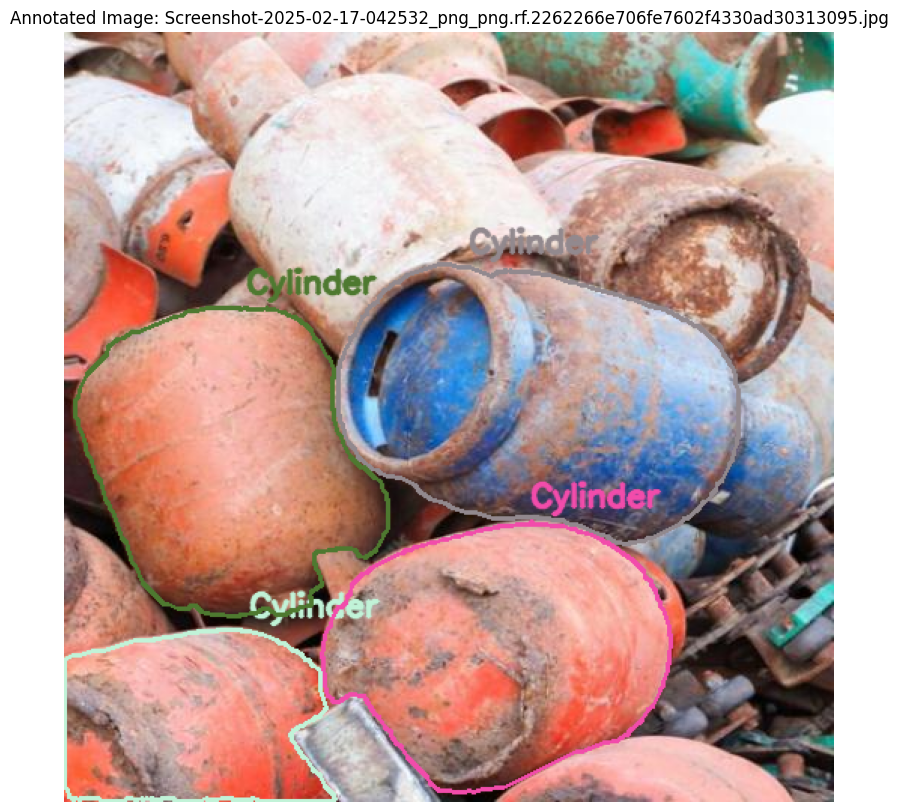

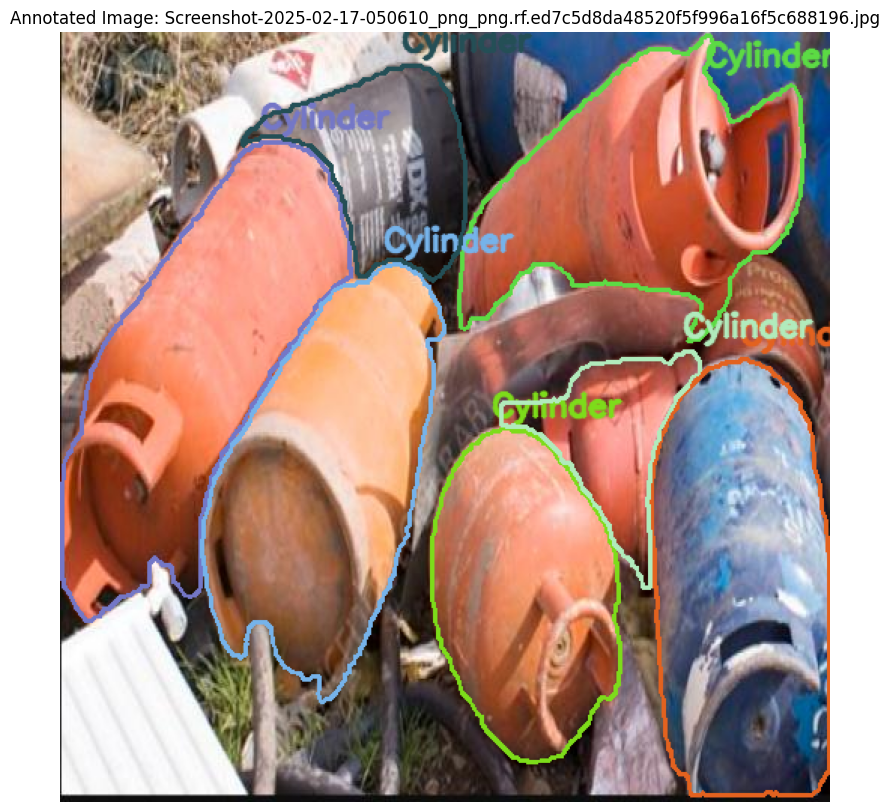

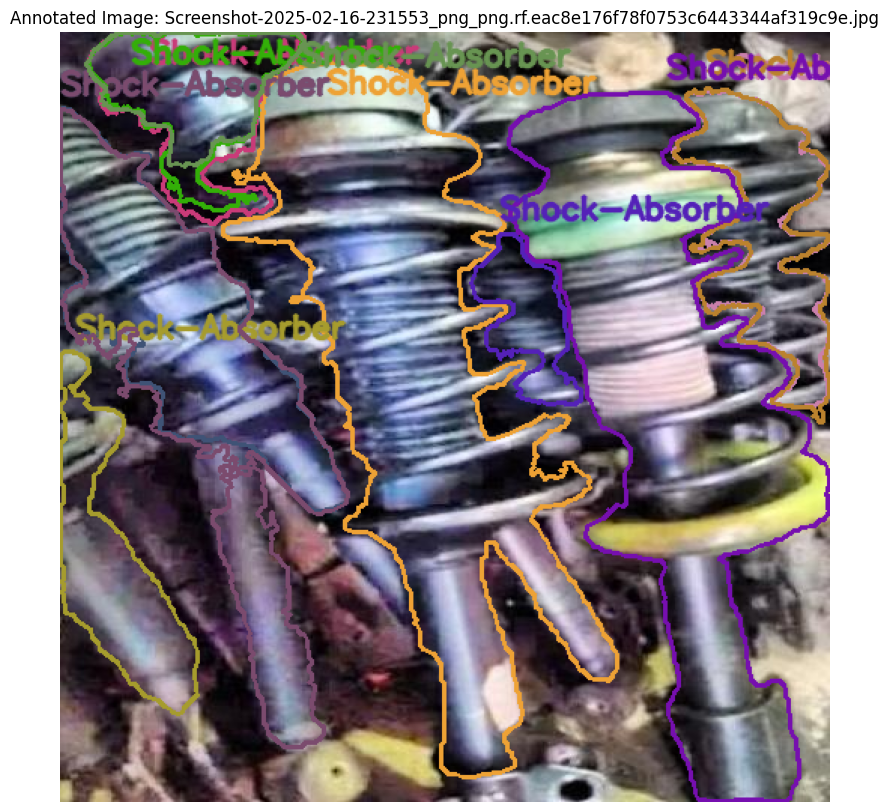


Displaying 3 sample annotated images from VAL set:


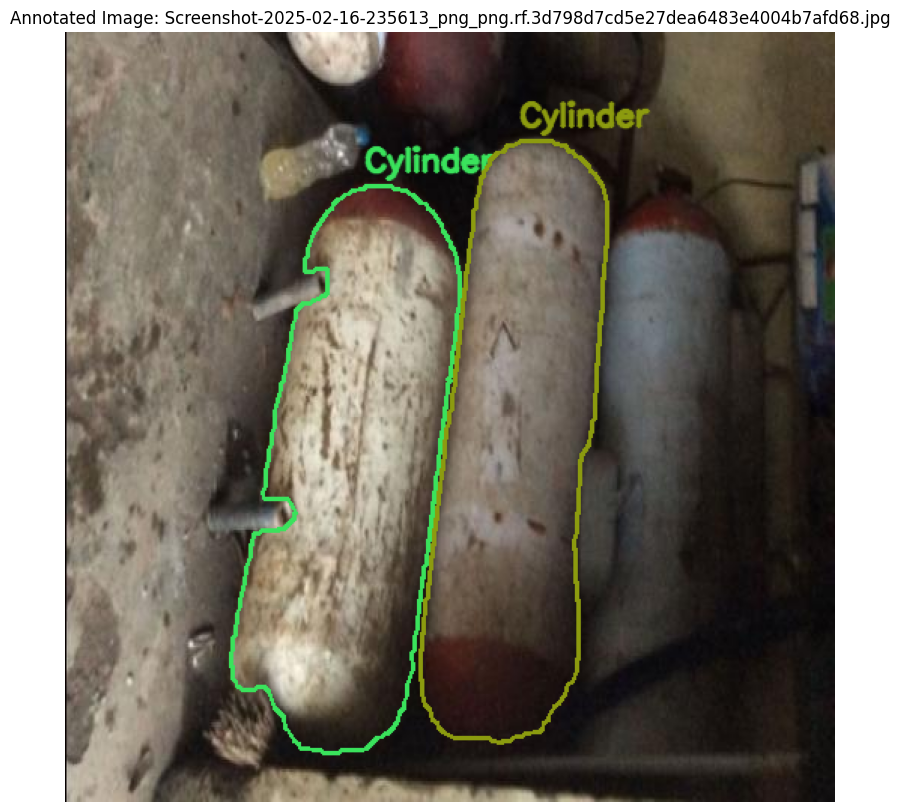

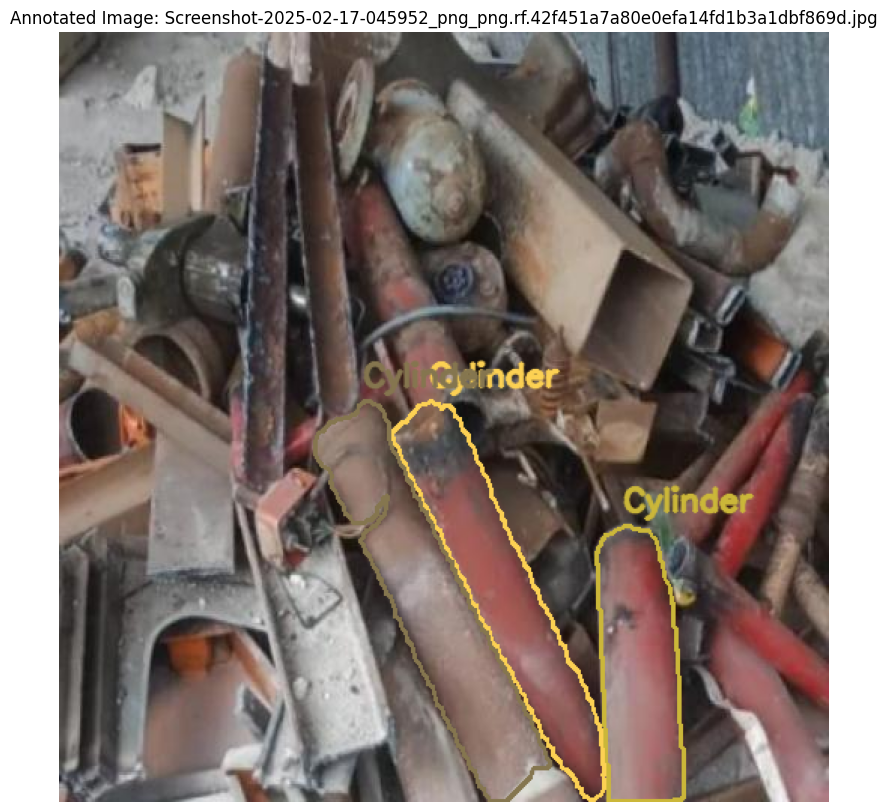

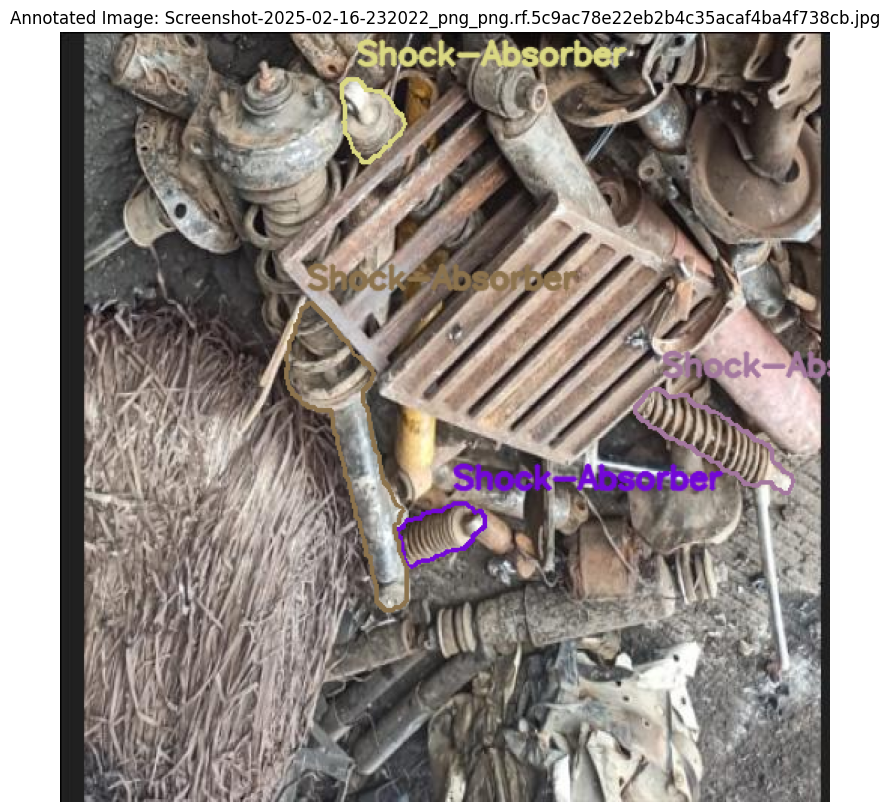


Displaying 3 sample annotated images from TEST set:


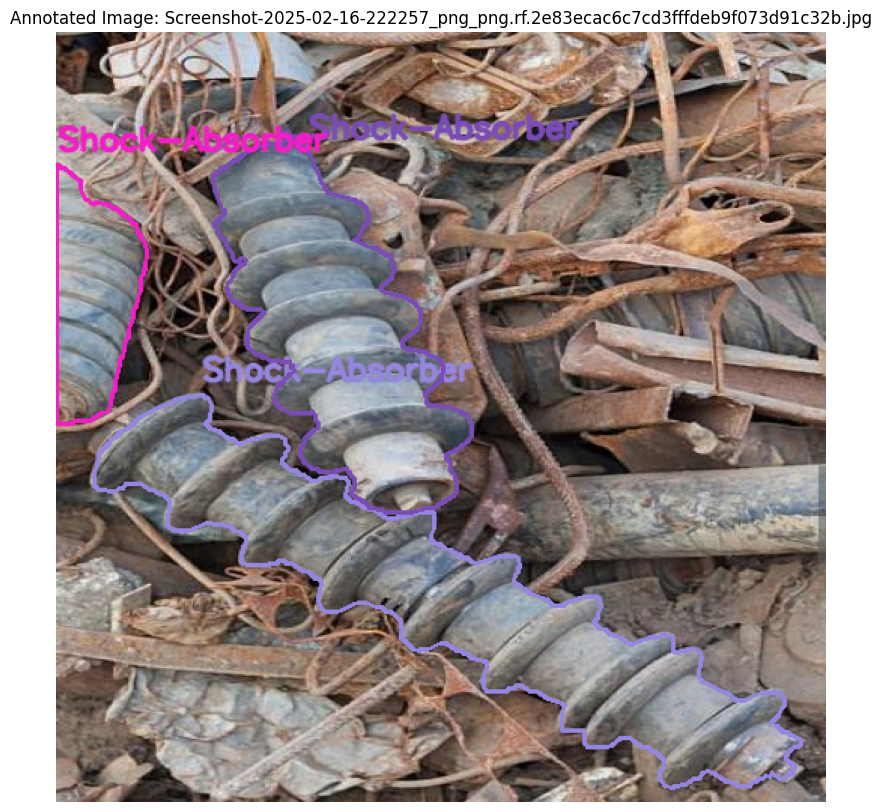

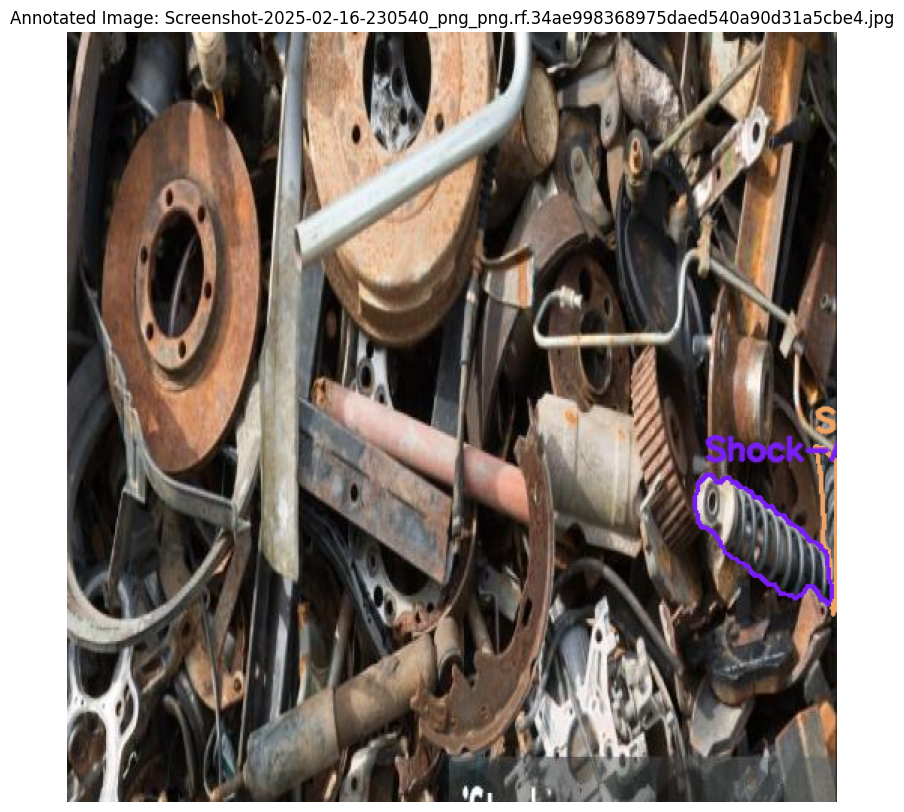

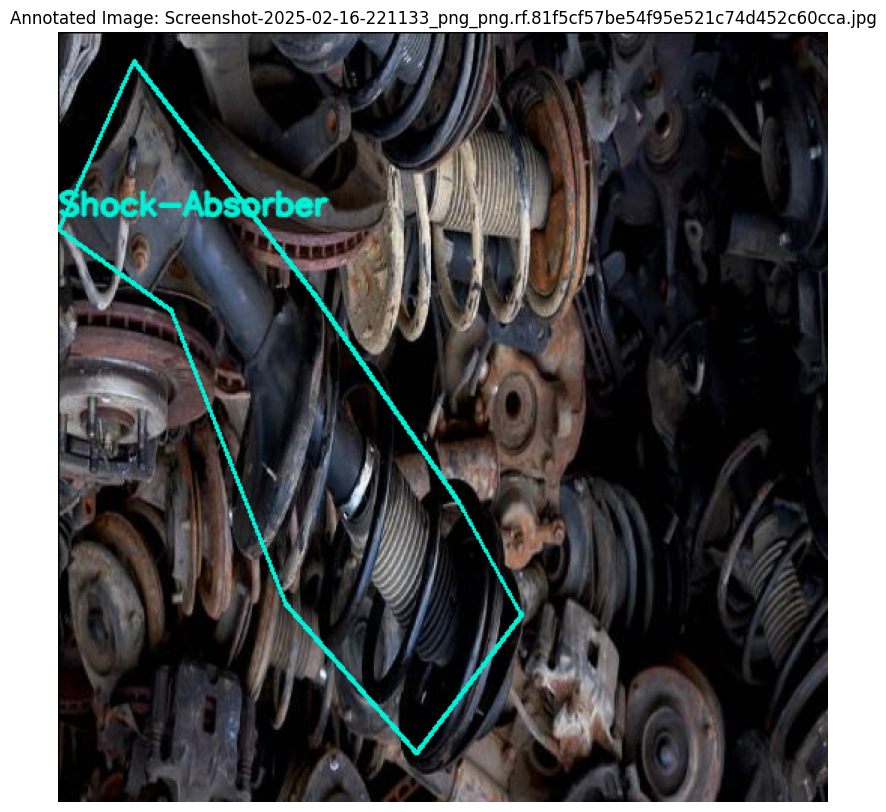


Sample Annotation Visualization Complete.


In [65]:
print("\n--- Visualizing Sample Annotations ---")

sample_size_per_split = 3

for split in ['train', 'val', 'test']:
    images_dir = base_dataset_path / 'images' / split
    labels_dir = base_dataset_path / 'labels' / split

    all_images = list(images_dir.glob('*'))

    if not all_images:
        print(f"No images found in {images_dir} for {split} split.")
        continue

    # Randomly select sample_size_per_split images, or fewer if not enough images exist
    sample_images = random.sample(all_images, min(len(all_images), sample_size_per_split))

    print(f"\nDisplaying {len(sample_images)} sample annotated images from {split.upper()} set:")
    for image_path in sample_images:
        label_path = labels_dir / (image_path.stem + '.txt')
        visualize_annotations(image_path, label_path, class_names)

print("\nSample Annotation Visualization Complete.")